In [1]:
import pandas as pd
import seaborn as sns
import scipy as sp
import math
import matplotlib.pyplot as plt
from plotly.offline import iplot
from scipy.spatial.distance import cosine
from plotly.offline import iplot
import plotly as py
import cufflinks as cf
import math 
import numpy as np
from scipy.stats import shapiro
from pyclustering.cluster.clique import clique, clique_visualizer
from pyclustering.utils import read_sample
from pyclustering.samples.definitions import FCPS_SAMPLES
from pyclustering.cluster import cluster_visualizer
from pyclustering.cluster.xmeans import xmeans
from pyclustering.cluster.center_initializer import kmeans_plusplus_initializer
from pyclustering.utils import read_sample
from pyclustering.samples.definitions import SIMPLE_SAMPLES
from pyclustering.cluster import cluster_visualizer_multidim
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
#scaling, normalization
from sklearn.preprocessing import StandardScaler, MinMaxScaler
#kmeans, dbscan, hierarchical (sklearn)
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
#evaluation
from sklearn.metrics import silhouette_score
#import dataset
from sklearn.datasets import load_iris

#distance matrix (dbscan elbow, hierarchical)
from scipy.spatial.distance import pdist, squareform
# hierarchical (scipy)
from scipy.cluster.hierarchy import linkage, dendrogram

In [2]:
df = pd.read_csv('file_train_senza_outliers.csv', skipinitialspace=True) 

In [5]:
genres = sorted(df['genre'].unique())
genres_mapping = dict(zip(genres, range(0, len(genres) + 1)))
df['genres_val'] = df['genre'].map(genres_mapping).astype(int)
df[['genre', 'genres_val']].head()

,genre,genres_val
0,j-dance,13
1,iranian,12
2,black-metal,1
3,bluegrass,2
4,happy,8


In [6]:
df=df.drop(["name", "artists", "album_name", "genre", 'explicit', 'key', 'mode'], axis=1)

In [7]:
df=df.drop(columns=df.columns[0], axis=1)

In [8]:
df.head()

,duration_ms,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,n_beats,n_bars,processing,genres_val
0,241.76,0.69,0.51,-12.53,0.10,0.30,0.54,0.28,0.64,142.22,4.0,567.0,141.0,1.28,13
1,444.00,0.07,0.20,-24.80,0.08,0.28,0.93,0.36,0.03,75.60,4.0,617.0,155.0,2.37,12
2,333.51,0.36,0.85,-7.44,0.04,0.00,0.80,0.26,0.49,116.63,4.0,652.0,162.0,3.70,1
3,269.80,0.52,0.58,-5.61,0.08,0.07,0.00,0.12,0.38,140.88,4.0,619.0,155.0,1.28,2
4,307.65,0.64,0.69,-11.34,0.05,0.00,0.10,0.30,0.64,143.96,4.0,733.0,183.0,4.07,8


In [9]:
X = df.select_dtypes(include=float).values

In [10]:
scaler = MinMaxScaler()
X_minmax = scaler.fit_transform(X)

In [11]:
dist = pdist(X_minmax, 'euclidean')
dist = squareform(dist)

## Fuzzy mean

In [12]:
!pip install  scikit-fuzzy

import skfuzzy as fuzz

     -------------------------------------- 994.0/994.0 kB 2.5 MB/s eta 0:00:00
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Created wheel for scikit-fuzzy: filename=scikit_fuzzy-0.4.2-py3-none-any.whl size=894075 sha256=136083eb747551b60e253b8d7090d8d7bf6fabbc937d33c4a10637ddb02f1224
  Stored in directory: c:\users\noemi\appdata\local\pip\cache\wheels\32\2c\a1\a90a7d7dd8448ec029f298a61f3490275e99b17aa348be675c
Successfully built scikit-fuzzy


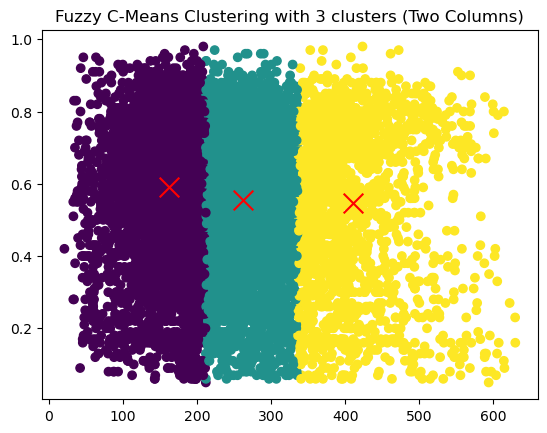

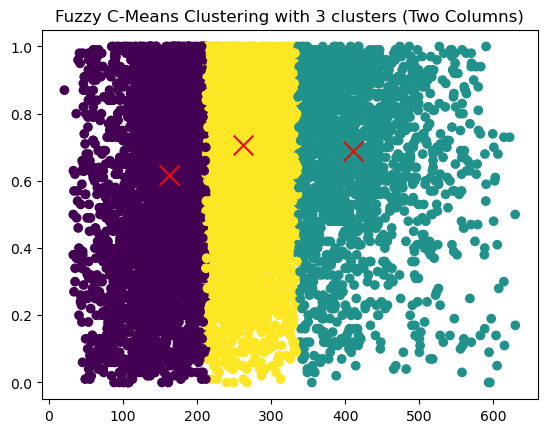

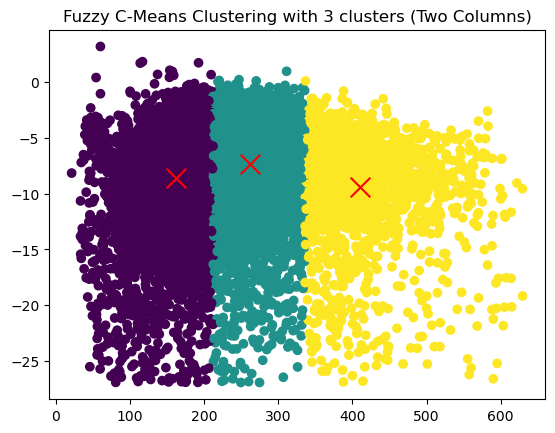

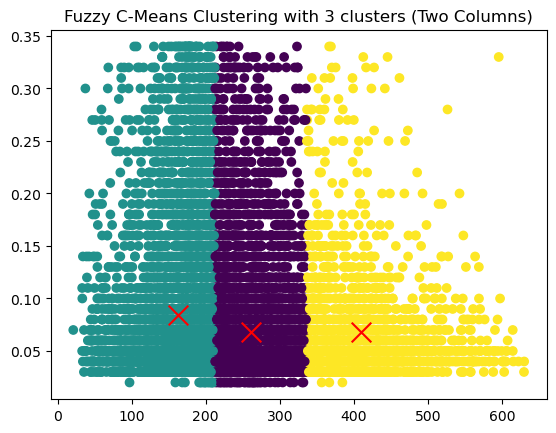

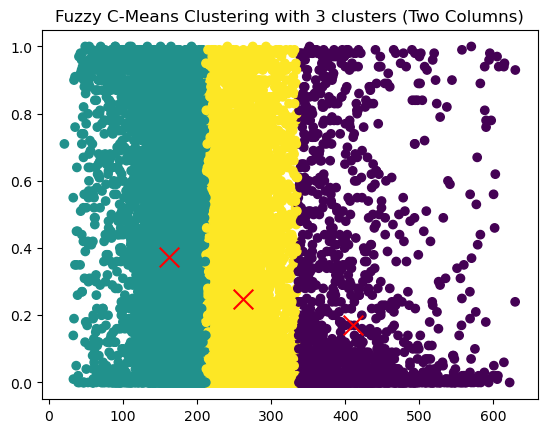

...

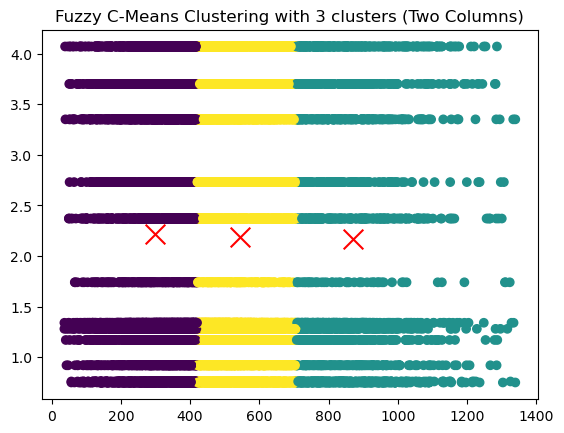

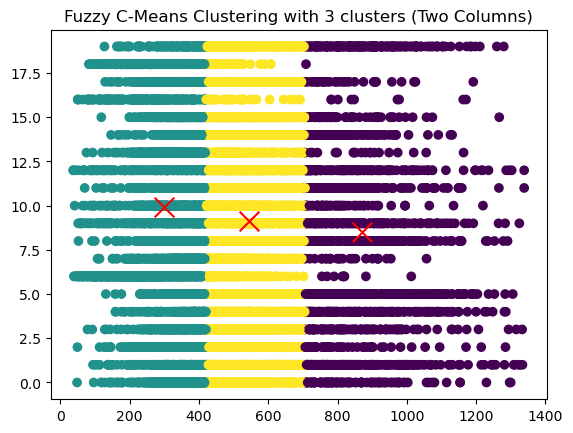

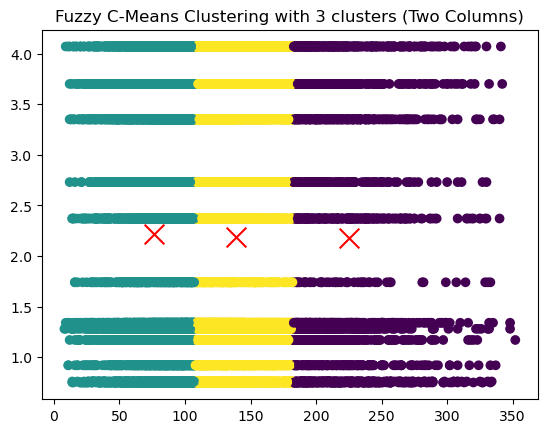

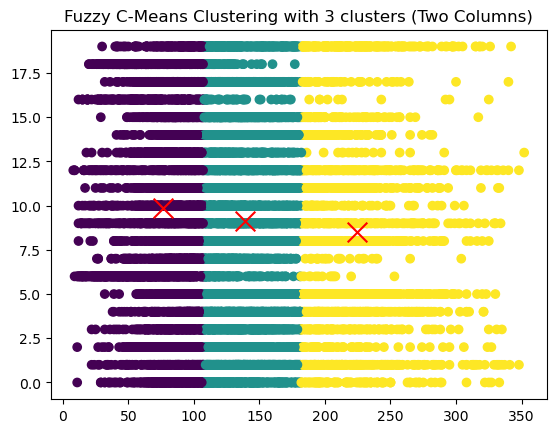

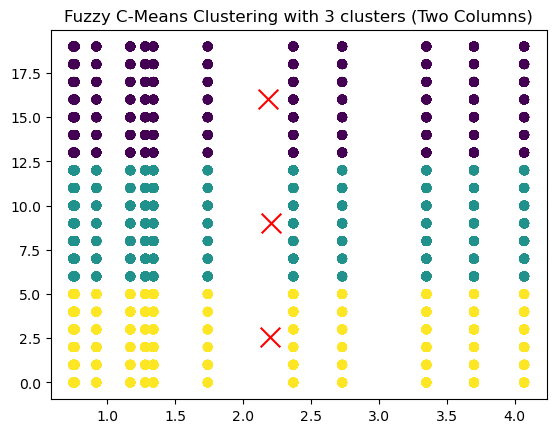

In [20]:
t=[]
for i in df.keys():
    for j in df.keys():
        if i!=j:
            if ([i,j] not in t) & ([j,i] not in t):
                t.append([i,j])
                data = df[[i,j]].values
                # Number of clusters
                c = 3

                # Fuzziness coefficient (typically between 1.1 and 2.0)
                m = 1.1

                # Maximum number of iterations
                max_iters = 100

                # Tolerance (stop when change in membership is smaller than this)
                tolerance = 1e-3

                # Fuzzy C-Means clustering
                cntr, u, u0, d, jm, p, fpc = fuzz.cluster.cmeans(
                    data.T, c, m, error=tolerance, maxiter=max_iters, init=None
                )

                # Get the cluster membership degrees
                cluster_membership = np.argmax(u, axis=0)

                # Visualize the data and cluster centers
                plt.scatter(data[:, 0], data[:, 1], c=cluster_membership, cmap='viridis')
                plt.scatter(cntr[:, 0], cntr[:, 1], c='red', marker='x', s=200)
                plt.title(f'Fuzzy C-Means Clustering with {c} clusters (Two Columns)')
                plt.show()